In [1]:
%matplotlib inline

from IPython.display import HTML

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, FFMpegWriter, PillowWriter
from matplotlib import rc

import pandas as pd

import torch
import numpy as np

import sys
import os
sys.path.append(os.path.abspath('../loss_surface_vis'))
from helper_electromagnetic import getOverlapIntegral #getCosSimMeasure, getMSE, 

import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 100

sys.path.append('../scripts/')
from config_plots import global_settings
global_settings()

from tqdm.notebook import tqdm

In [2]:
csv_file_path = '/home/elhamod/projects/jiesRepo/Cophy-PGNN/models/-0x544ff2c934fa5926_examples.csv' #DNN
# csv_file_path = '/home/elhamod/projects/jiesRepo/Cophy-PGNN/models/0x49583cf87637eb8_examples.csv' #Cophy-PGNN
# csv_file_path = '/home/elhamod/projects/jiesRepo/Cophy-PGNN/models/0x575808717bbd1e5b_examples.csv' #PGNN-analogue

folder_name = "../figures" 
fileNameOutput = "Example_wavefunction_nn.pdf"
fig_title = 'NN'

In [3]:
#Read csv and get info

df_examples = pd.read_csv(csv_file_path)
num_columns = len(df_examples.columns) - 1 # ignore index

num_columns_per_vector = int(num_columns/2)

df_examples_prediction = df_examples.iloc[:, 1:int(num_columns_per_vector+1)]
df_examples_true = df_examples.iloc[:, int(num_columns_per_vector+1):]

prediction_tensor = torch.from_numpy(df_examples_prediction.values)
true_tensor = torch.from_numpy(df_examples_true.values)

frames = 50 #prediction_tensor.shape[0]

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


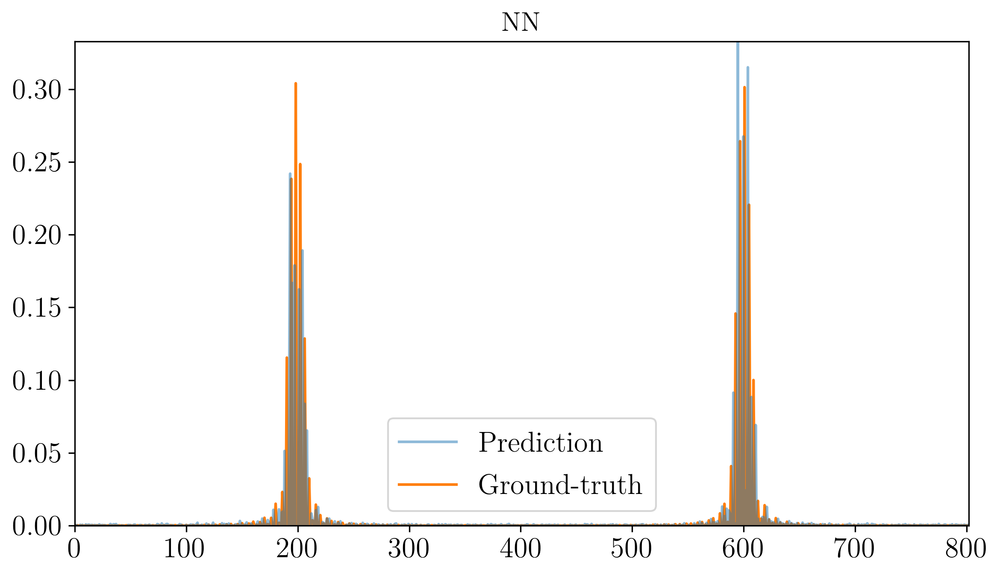

In [4]:
epoch = 2500

fig, ax = plt.subplots()

line, = ax.plot([], alpha=0.5,zorder=2)
line2, = ax.plot([], alpha=1,zorder=1)

x = np.linspace(0, num_columns_per_vector, num_columns_per_vector)

ax.set_xlim(0, num_columns_per_vector)
y_max = torch.max(torch.cat((prediction_tensor[epoch, :], true_tensor[epoch, :])))
ax.set_ylim(0, y_max.item())
y1 = prediction_tensor[epoch, :].detach().numpy()
y2 = true_tensor[epoch, :].detach().numpy()
# overlap = getOverlapIntegral(prediction_tensor[epoch, :].view(1, -1), true_tensor[epoch, :].view(1, -1))
ax.set_title(fig_title)
line.set_label('Prediction')
line2.set_label('Ground-truth')
line.set_data((x, y1))
line2.set_data((x, y2))
ax.legend()
fig.savefig(os.path.join(folder_name, fileNameOutput), bbox_inches='tight')

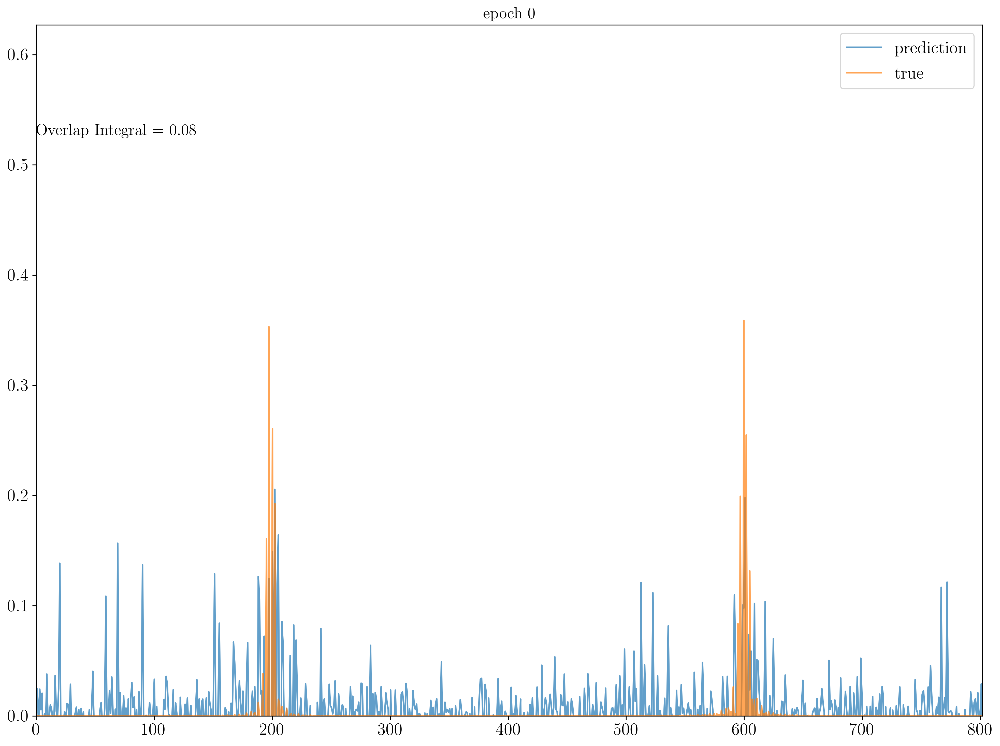

In [5]:
fig, ax = plt.subplots(figsize=(16,12))

line, = ax.plot([], alpha=0.7)
line2, = ax.plot([], alpha=0.7)

x = np.linspace(0, num_columns_per_vector, num_columns_per_vector)

ax.set_xlim(0, num_columns_per_vector)
y_max = torch.max(torch.cat((prediction_tensor, true_tensor)))
ax.set_ylim(0, y_max.item())
textvar = ax.text(0.1, y_max-0.1, "test") #, fontsize=15

bar_ = tqdm(total=frames)

def animate(frame_num):
#     print(frame_num)
    y1 = prediction_tensor[frame_num, :].detach().numpy()
    y2 = true_tensor[frame_num, :].detach().numpy()
    overlap = getOverlapIntegral(prediction_tensor[frame_num, :].view(1, -1), true_tensor[frame_num, :].view(1, -1))
    ax.set_title('epoch ' + str(frame_num))
    line.set_label('prediction')
    line2.set_label('true')
    line.set_data((x, y1))
    line2.set_data((x, y2))
    ax.legend()
    textvar.set_text("Overlap Integral = " +  ("%.2f" % overlap))
    bar_.update()
    return line

anim = FuncAnimation(fig, animate, frames=frames, interval=100)
HTML(anim.to_jshtml())

In [ ]:
import os

movie_filename = os.path.join(folder_name, os.path.splitext(csv_file_path)[0]+'.gif')
writergif = PillowWriter(fps=30) 
anim.save(movie_filename, writer=writergif)

